# This notebook provides a transparent visualization and statistics of the Coronavirus (COVID-19) Vaccinations and Excess Mortality Dataset OWID
It is split into essentially two large parts
1. [Correlation over time between vaccinations and excessive mortality](#Correlation-over-time-between-vaccinations-and-excessive-mortality)
2. [Cumulative Excess Mortality vs Latest Vaccination Levels](Cumulative-Excess-Mortality-vs-Latest-Vaccination-Levels)

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn import linear_model
from scipy.signal import find_peaks

In [2]:
d=pd.read_excel('https://covid.ourworldindata.org/data/owid-covid-data.xlsx')

In [3]:
#d=pd.read_excel('owid-covid-data.xlsx')

# Let's see what is in the dataset

In [4]:
d.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

| Domain | Type | Status | column |
|---|---|---|---|
| Country informaiton | descriptive | descriptive | 'iso_code', 'continent', 'location', |
| Cases | original metrics | semi-dependent | 'total_cases', 'new_cases', 'new_cases_smoothed', |
| Death | original metrics | dependent | 'total_deaths', 'new_deaths', 'new_deaths_smoothed', |
| Cases | averaged metrics | semi-dependent | 'total_cases_per_million', 'new_cases_per_million', 'new_cases_smoothed_per_million',|
| Death | averaged metrics | dependent | 'total_deaths_per_million', 'new_deaths_per_million', 'new_deaths_smoothed_per_million',|
| Cases | calculated metrics | semi-dependent | 'reproduction_rate', |       
| Cases | original metrics | semi-dependent | 'icu_patients', 'hosp_patients', 'weekly_icu_admissions', 'weekly_hosp_admissions',|        
| Cases | averaged metrics | semi-dependent | 'icu_patients_per_million', 'hosp_patients_per_million', 'weekly_icu_admissions_per_million', 'weekly_hosp_admissions_per_million',|
| Tests | | independent|'total_tests_per_thousand', 'new_tests_per_thousand',       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',       'positive_rate', 'tests_per_case', 'tests_units',|
| Vaccinations | | independent|'total_vaccinations',        'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',        'new_vaccinations', 'new_vaccinations_smoothed',        'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',        'new_vaccinations_smoothed_per_million',        'new_people_vaccinated_smoothed',       'new_people_vaccinated_smoothed_per_hundred',|
| Country informaiton | confounding | independent | 'population', 'population_density', 'median_age', 'aged_65_older',        'aged_70_older', 'gdp_per_capita', 'extreme_poverty',       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',       'life_expectancy', 'human_development_index',|
|Policy| confounding | independent |'stringency_index',|
| Death | original metrics | dependent |'excess_mortality_cumulative_absolute', 'excess_mortality_cumulative', 'excess_mortality', 'excess_mortality_cumulative_per_million'|


In [5]:
d[['excess_mortality','total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',]].describe().style.set_precision(1)


,excess_mortality,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred
count,5234.0,40087.0,38378.0,35521.0,12923.0
mean,16.2,62.7,34.3,28.5,6.3
std,31.1,57.3,27.8,26.2,11.2
min,-95.9,0.0,0.0,0.0,0.0
25%,-0.5,9.3,6.8,3.8,0.0
50%,7.2,47.5,30.5,21.1,0.5
75%,22.7,108.4,59.6,51.4,7.3
max,374.3,323.3,122.3,119.0,81.9


# Correlation over time between vaccinations and excessive mortality
We use pandas.DataFrame.corr to compute pairwise correlation of columns, **excluding NA/null values**.

https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html

https://www.iban.com/country-codes

In [6]:
for metric in ['total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',]:
    print(metric ,'and excess_mortality')
    print('Correlation coefficient = {:.2f}'.format(d[['excess_mortality', metric]].corr().unstack()[1]))
    reg = linear_model.LinearRegression()
    dfr=d[ (~d['excess_mortality'].isnull()) & (~d[metric].isnull())]
    X = dfr[[metric,]].fillna(dfr.mean()).values
    y = dfr['excess_mortality'].values
    model = reg.fit(X,y)
    print('Linear model coefficient = {:.2f}'.format(model.coef_[0]))
    print("R^2 ={: 1.0f}%".format(100*reg.score(X, y)))
del dfr    

total_vaccinations_per_hundred and excess_mortality
Correlation coefficient = -0.19
Linear model coefficient = -0.11
R^2 = 4%
people_vaccinated_per_hundred and excess_mortality
Correlation coefficient = -0.20
Linear model coefficient = -0.24
R^2 = 4%
people_fully_vaccinated_per_hundred and excess_mortality
Correlation coefficient = -0.16
Linear model coefficient = -0.20
R^2 = 3%
total_boosters_per_hundred and excess_mortality
Correlation coefficient = 0.01
Linear model coefficient = 0.06
R^2 = 0%


# Correlation over time between vaccinations and new deaths per million
Same as above but the metric is not cumulative and obviously may be seasonal so we would need to account for seasonality to get something meaningfull but let's check anyway.

In [7]:
for metric in ['total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',]:
    print(metric ,'and new_deaths_per_million')
    print('Correlation coefficient = {:.2f}'.format(d[['new_deaths_per_million', metric]].corr().unstack()[1]))
    reg = linear_model.LinearRegression()
    dfr=d[ (~d['new_deaths_per_million'].isnull()) & (~d[metric].isnull())]
    X = dfr[[metric,]].fillna(dfr.mean()).values
    y = dfr['new_deaths_per_million'].values
    model = reg.fit(X,y)
    print('Linear model coefficient = {:.2f}'.format(model.coef_[0]))
    print("R^2 ={: 1.0f}%".format(100*reg.score(X, y)))
del dfr    

total_vaccinations_per_hundred and new_deaths_per_million
Correlation coefficient = -0.11
Linear model coefficient = -0.01
R^2 = 1%
people_vaccinated_per_hundred and new_deaths_per_million
Correlation coefficient = -0.10
Linear model coefficient = -0.02
R^2 = 1%
people_fully_vaccinated_per_hundred and new_deaths_per_million
Correlation coefficient = -0.12
Linear model coefficient = -0.02
R^2 = 2%
total_boosters_per_hundred and new_deaths_per_million
Correlation coefficient = -0.01
Linear model coefficient = -0.00
R^2 = 0%


## De-averaging of the correlation over time by countries

## Correlation between ongoing vaccination numbers and cumulative excess mortality up to the moment

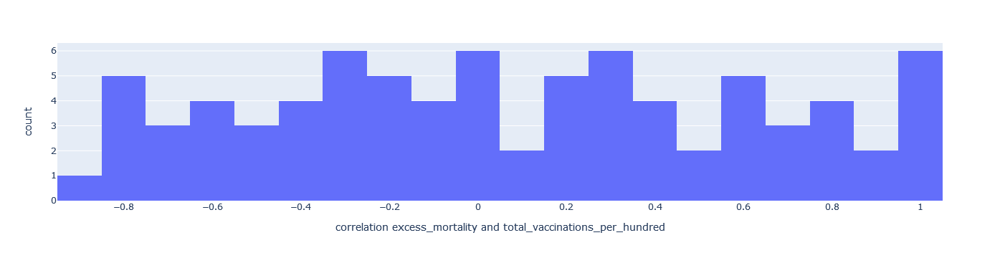

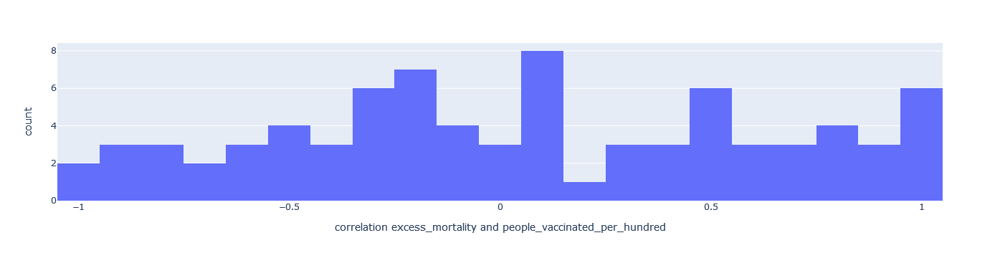

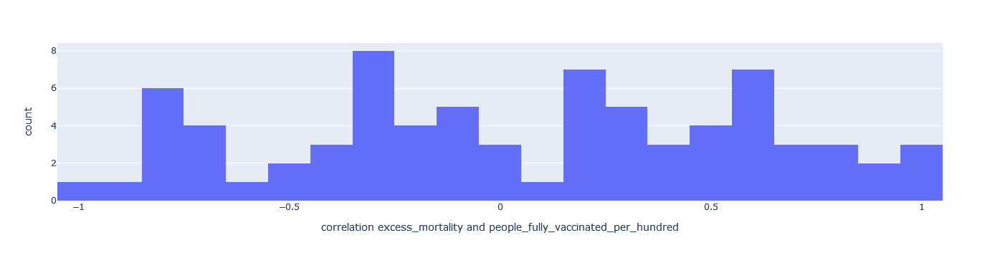

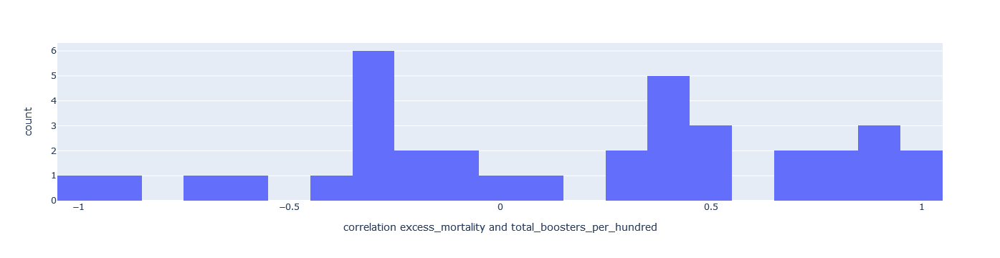

In [8]:
#pd.set_option('display.max_rows', None)
for metric in ['total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',]:
    country_corr=d.groupby('iso_code')[['excess_mortality', metric]].corr().unstack().iloc[:,1].reset_index()
    country_corr.columns=['iso_code','correlation excess_mortality and '+metric]
    px.histogram(country_corr, x='correlation excess_mortality and '+metric, nbins=30,).show()

## Correlation between ongoing vaccination numbers and new deaths

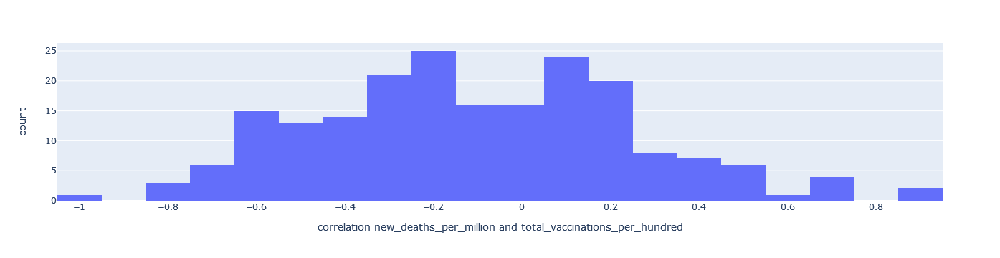

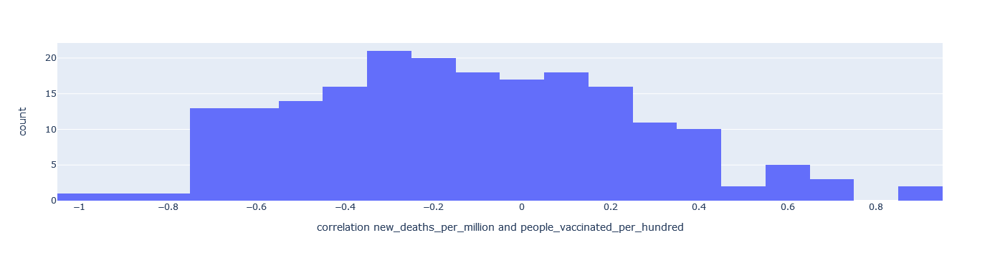

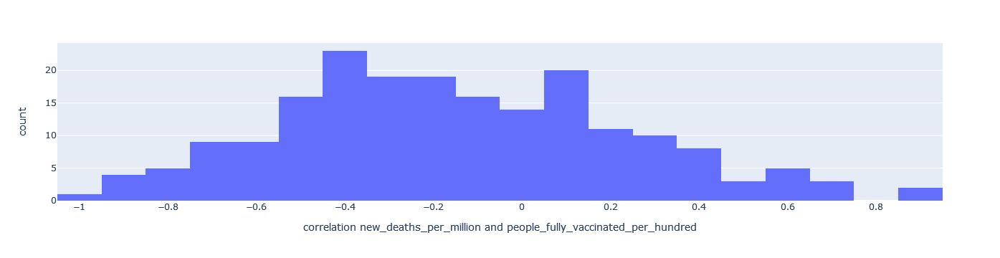

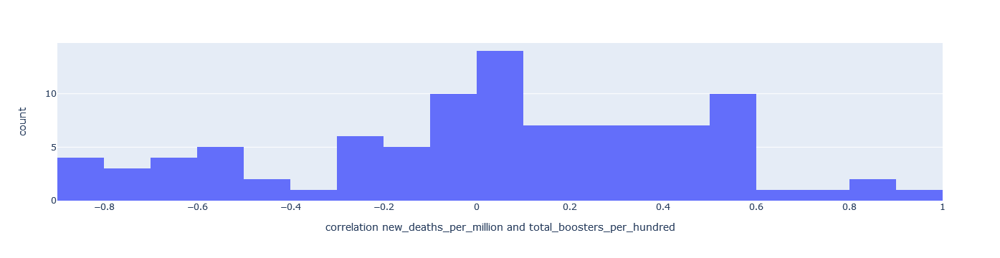

In [9]:
#pd.set_option('display.max_rows', None)
for metric in ['total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',]:
    country_corr=d.groupby('iso_code')[['new_deaths_per_million', metric]].corr().unstack().iloc[:,1].reset_index()
    country_corr.columns=['iso_code','correlation new_deaths_per_million and '+metric]
    px.histogram(country_corr, x='correlation new_deaths_per_million and '+metric, nbins=30,).show()

### There is an empirical clustering of countries by the ['excess_mortality_cumulative_per_million']/['total_vaccinations_per_hundred']>25 let's see whether it plays any role

excess_mortality_vaccination_cluster {'LVA', 'ROU', 'MNE', 'GTM', 'PHL', 'SVK', 'ARM', 'GEO', 'SRB', 'OWID_KOS', 'COL', 'PRY', 'POL', 'MEX', 'MKD', 'TUN', 'AZE', 'BOL', 'PAN', 'SMR', 'LTU', 'OMN', 'ALB', 'ARG', 'HRV', 'MDA', 'BGR', 'CZE', 'ZAF', 'KAZ', 'PER', 'LBN', 'RUS', 'KGZ', 'UKR', 'ECU'}


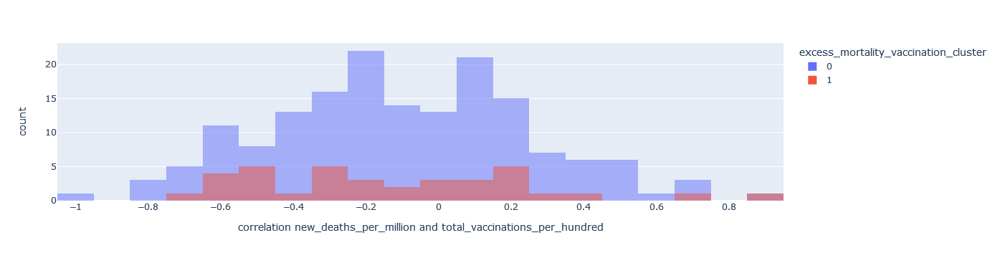

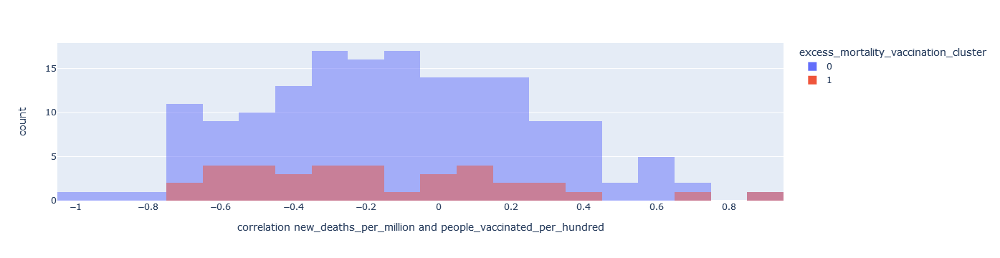

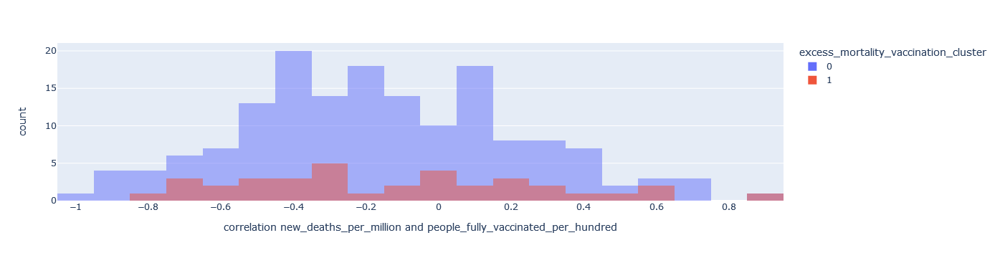

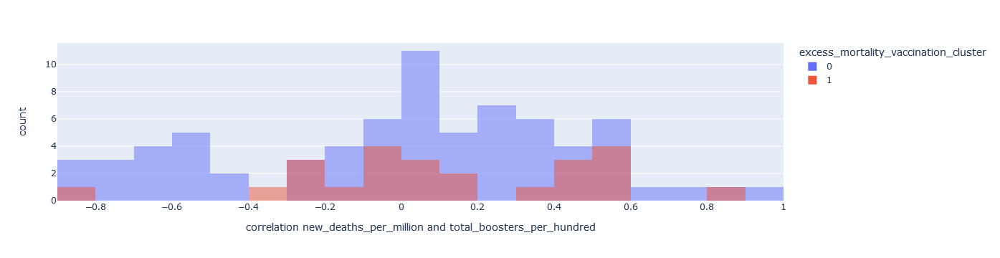

In [10]:
df=d[(~d['excess_mortality_cumulative_per_million'].isnull()) & (~d['total_vaccinations_per_hundred'].isnull())]
df_latest=df.loc[df.groupby(['iso_code'])['total_vaccinations_per_hundred'].idxmax()]
df_latest['excess_mortality_vaccination_cluster']=np.where(df_latest['excess_mortality_cumulative_per_million']/df_latest['total_vaccinations_per_hundred']>25,'1','0')
excess_mortality_vaccination_cluster=set(df_latest.loc[df_latest.excess_mortality_vaccination_cluster=='1','iso_code'])
print('excess_mortality_vaccination_cluster',excess_mortality_vaccination_cluster)
for metric in ['total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',]:
    country_corr=d.groupby('iso_code')[['new_deaths_per_million', metric]].corr().unstack().iloc[:,1].reset_index()
    country_corr['excess_mortality_vaccination_cluster']=np.where(country_corr.iso_code.isin(excess_mortality_vaccination_cluster),'1','0')
    country_corr.columns=['iso_code','correlation new_deaths_per_million and '+metric,'excess_mortality_vaccination_cluster']
    px.histogram(country_corr, x='correlation new_deaths_per_million and '+metric, nbins=30, color='excess_mortality_vaccination_cluster', barmode="overlay").show()
    
del df, df_latest    

### It is surprising that there are so many countries with very high positive correlation of excess mortality and various vaccination metrics over time.
Overal the correlation values are all over the [-1,1] interval so it is not clear what is their relationship.

The distribution is similar for all four vaccination metrics although (as expected) the number of countries we can calculate correlation is decreasing with higher level of specificity and vaccination step.

### So let's see what countries are in the dataset and what are actual correlation values?
Lets look at **total_vaccinations_per_hundred** because it has the most data available as we saw in above in dataframe describe() results.

In [11]:
pd.set_option('display.max_rows', None)
country_corr=d.groupby('iso_code')[['excess_mortality','total_vaccinations_per_hundred']].corr().unstack().iloc[:,1].reset_index()
country_corr.columns=['iso_code','correlation excess_mortality and total_vaccinations_per_hundred']
df_cntry_corr=country_corr[~country_corr['correlation excess_mortality and total_vaccinations_per_hundred'].isna()].sort_values(
        'correlation excess_mortality and total_vaccinations_per_hundred',ascending=False
    )
df_cntry_corr
df_cntry_corr.style.set_precision(2)

,iso_code,correlation excess_mortality and total_vaccinations_per_hundred
8,ARM,1.00
152,OMN,1.00
81,GRL,1.00
225,UZB,1.00
82,GTM,0.97
160,OWID_KOS,0.97
148,NOR,0.89
140,MYS,0.86
54,DNK,0.85
71,GEO,0.83


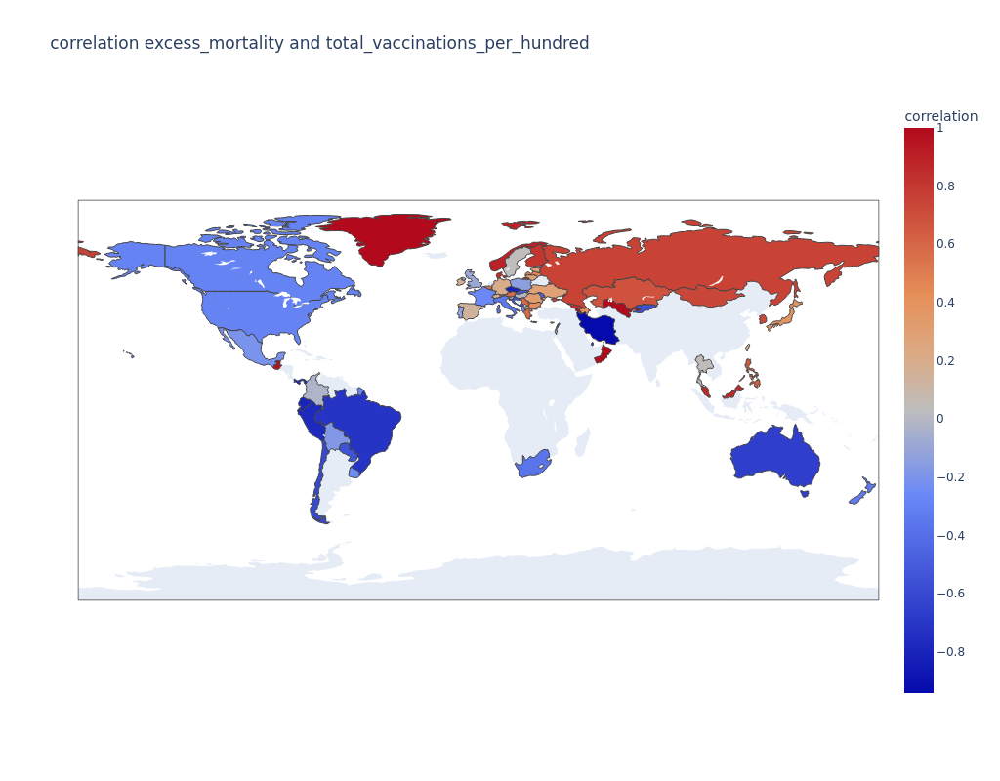

In [12]:
fig = go.Figure(data=go.Choropleth(
    locationmode = 'ISO-3',
    locations = df_cntry_corr['iso_code'],
    z = df_cntry_corr['correlation excess_mortality and total_vaccinations_per_hundred'],
    autocolorscale=False,
    colorbar_title = 'correlation',
))

fig.update_layout(
    width=1024,
    height=800,
    title_text='correlation excess_mortality and total_vaccinations_per_hundred',
    geo=dict(
        showcoastlines=False,
    ),
    )
fig.show('png')

### Data Exploration to Exclude Meaningless Datapoints
We need to make some very basic decisions as to which countries to include into our analysis. Some do not have enough meaningful data. 

So first we only keep countries where the correlation can be calculated at all (at least some mutual data points present).

Then we exclude rows with no excess mortality data at all and visualize the data.
         

In [13]:
countries_worth_looking_at=list(
    country_corr[~country_corr['correlation excess_mortality and total_vaccinations_per_hundred'].isna()].sort_values(
        'correlation excess_mortality and total_vaccinations_per_hundred',ascending=False
    )['iso_code']
)

In [14]:
print(countries_worth_looking_at)

['ARM', 'OMN', 'GRL', 'UZB', 'GTM', 'OWID_KOS', 'NOR', 'MYS', 'DNK', 'GEO', 'FIN', 'RUS', 'MNG', 'KOR', 'KAZ', 'PHL', 'SGP', 'SRB', 'GRC', 'AUT', 'BEL', 'LVA', 'HKG', 'BGR', 'AZE', 'JPN', 'ROU', 'CYP', 'LTU', 'ABW', 'UKR', 'EST', 'DEU', 'CHE', 'IRL', 'LUX', 'TWN', 'ESP', 'MKD', 'THA', 'SWE', 'ISR', 'SVN', 'HUN', 'COL', 'GBR', 'MLT', 'PRT', 'POL', 'BOL', 'MEX', 'MAC', 'ALB', 'FRO', 'URY', 'FRA', 'BRB', 'CAN', 'USA', 'NZL', 'ITA', 'ZAF', 'MNE', 'MDA', 'LIE', 'SVK', 'HRV', 'PRY', 'KGZ', 'LBN', 'CHL', 'AUS', 'QAT', 'BRA', 'PER', 'PAN', 'SMR', 'ECU', 'CZE', 'IRN']


In [15]:
df=d[ (~d['excess_mortality'].isnull()) & (d['iso_code'].isin(countries_worth_looking_at)) ]

What we will see is that the total_vaccinations_per_hundred data is not contigious but at least it is monotonous as one should expect. It may be helpful to fill the blanks with some polinomial approximation.

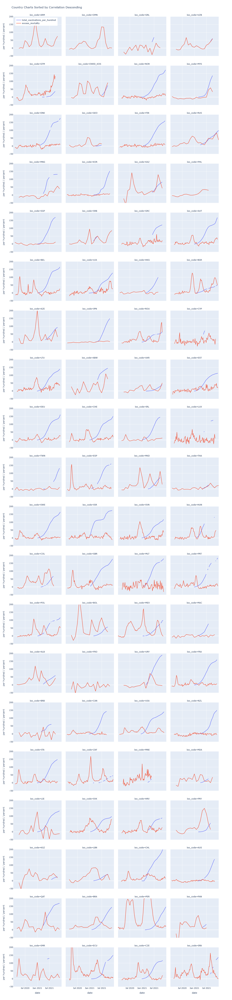

In [16]:
fig = px.line(df,    
              x='date',
              y=['total_vaccinations_per_hundred','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

### Same charts but for new_deaths_per_million now

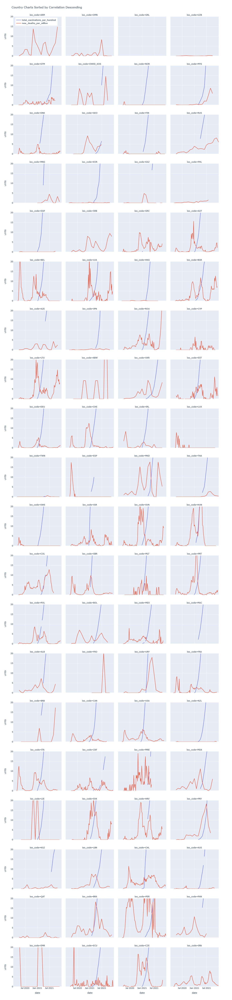

In [17]:
fig = px.line(df,    
              x='date',
              y=['total_vaccinations_per_hundred','new_deaths_per_million',],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "units",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[0, 20])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

Lets exclude ['ARM','FRO','OMN','PHL']

In [18]:
for country in ['ARM','FRO','OMN','PHL']: countries_worth_looking_at.remove(country)

In [19]:
df=d[ (~d['excess_mortality'].isnull()) & (d['iso_code'].isin(countries_worth_looking_at)) ]

As expected the data on "fully" vaccinated is less availabe and we would have to exclude 'SMR','LUX' at least. So let's stick to total_vaccinations_per_hundred, in theory every vaccination should be helpful. 

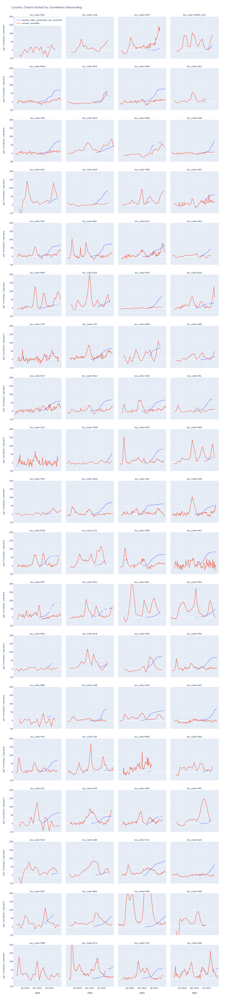

In [20]:
fig = px.line(df,    
              x='date',
              y=['people_fully_vaccinated_per_hundred','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

### Country Charts Sorted by Country ISO CODE 'total_vaccinations_per_hundred','excess_mortality'

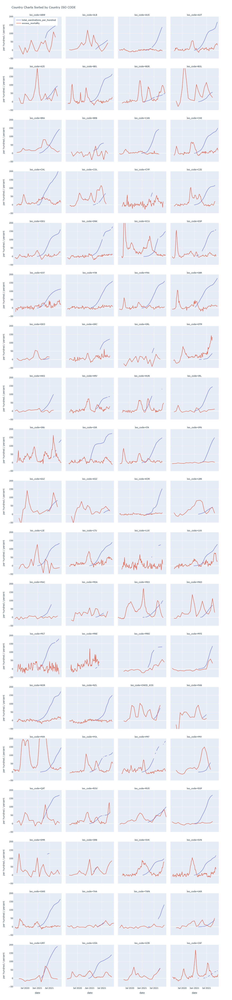

In [21]:
fig = px.line(df,    
              x='date',
              y=['total_vaccinations_per_hundred','excess_mortality'],
              facet_col='iso_code',
              category_orders={'iso_code':sorted(countries_worth_looking_at)},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Country ISO CODE",
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

## Number of peaks in excess_mortality
It is not clear how to set the peak detection parameters so this is rather arbitrary.

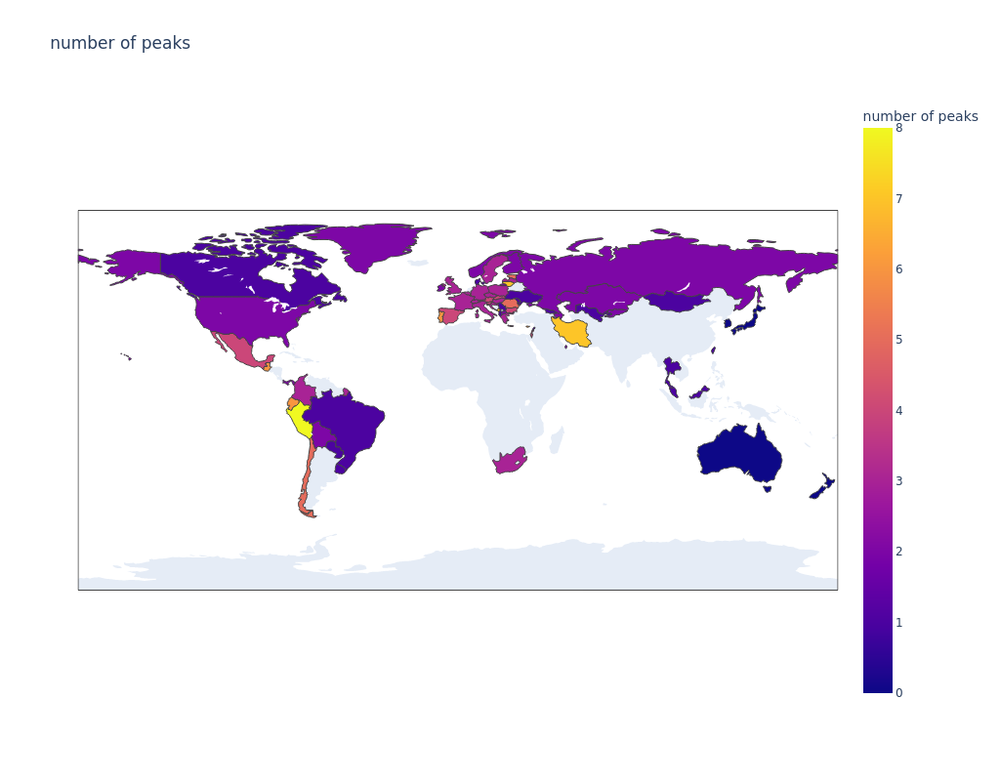

,iso_code,number of peaks
0,ABW,2
1,ALB,1
2,AUS,0
3,AUT,4
4,AZE,2
5,BEL,3
6,BGR,4
7,BOL,2
8,BRA,1
9,BRB,1


In [22]:
df_cntry_peaks = df.groupby('iso_code')['excess_mortality'].apply(lambda x: len( find_peaks(x,  height=15, threshold=1, distance=8)[0] ) ).reset_index()
df_cntry_peaks.columns=['iso_code','number of peaks']
fig = go.Figure(data=go.Choropleth(
    locationmode = 'ISO-3',
    locations = df_cntry_peaks['iso_code'],
    z = df_cntry_peaks['number of peaks'],
    #autocolorscale=False,
    colorbar_title = 'number of peaks',
))

fig.update_layout(
    width=1024,
    height=800,
    title_text='number of peaks',
    geo=dict(
        showcoastlines=False,
    ),
    )
fig.show('png')
df_cntry_peaks

## Can we see any relationship between 'aged_65_older' and 'excess_mortality'?

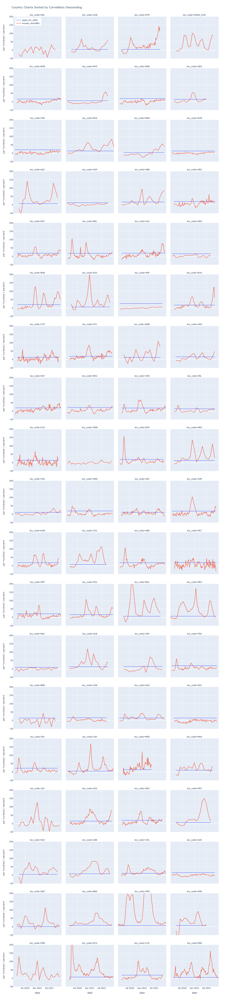

In [23]:
fig = px.line(df,    
              x='date',
              y=['aged_65_older','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

## What data is actually used to calculate the correllation?
Only the data points where both excess_mortality AND total_vaccinations_per_hundred is present can be used to calculate the correlation. The data looks quite different from this angle.

We re-run the same charting code but just throw away rows where d['total_vaccinations_per_hundred'].isnull().

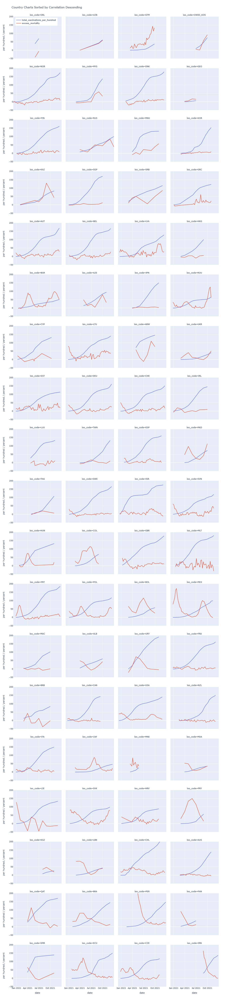

In [24]:
dfc=d[ (~d['excess_mortality'].isnull()) & (d['iso_code'].isin(countries_worth_looking_at)) & (~d['total_vaccinations_per_hundred'].isnull())]
fig = px.line(dfc,    
              x='date',
              y=['total_vaccinations_per_hundred','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",              
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

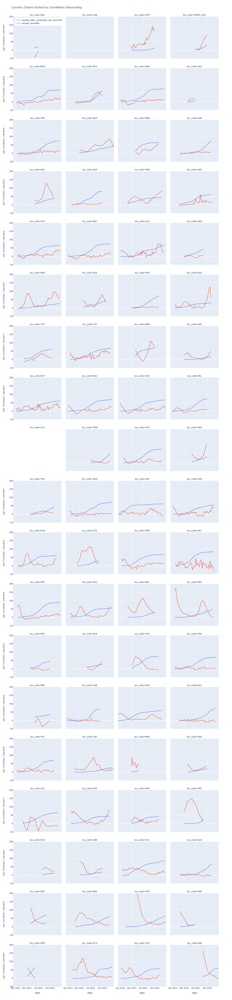

In [25]:
dfc=d[ (~d['excess_mortality'].isnull()) & (d['iso_code'].isin(countries_worth_looking_at)) & (~d['people_fully_vaccinated_per_hundred'].isnull())]
fig = px.line(dfc,    
              x='date',
              y=['people_fully_vaccinated_per_hundred','excess_mortality'],
              facet_col='iso_code', 
              category_orders={'iso_code':countries_worth_looking_at},
              facet_col_wrap=4,
              facet_row_spacing=0.01,
              height=6000, width=800,
              labels={
                  "value": "per hundred / percent",
                  "variable": "",
              },
              title="Country Charts Sorted by Correlation Descending",              
             )
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.999,
    xanchor="left",
    x=0.01
))   
fig.update_yaxes(range=[-50, 200])
fig.show() # we can't use 'png' here as the charts get scrumbled, a plotly bug?

# Cumulative Excess Mortality vs Latest Vaccination Levels
Even though we see that the relationship is far from linear let's see how the "final" values are related. We will take the cumulative data column that is more suitable for this calculation and the maximal vaccination value. To not to skew due to later values of either vaccination nor excess_mortality, let's limit dataset to the rows where both are present. As the number of vaccinations is naturally not decreasing we will use it to find the latest row.

In [26]:
df_max=d[(~d['excess_mortality_cumulative_per_million'].isnull()) & (~d['total_vaccinations_per_hundred'].isnull()
          & (d['iso_code'].isin(countries_worth_looking_at)) )
        ].loc[df.groupby(['iso_code'])['total_vaccinations_per_hundred'].idxmax()] 

## Scatter Chart 
max excess_mortality_cumulative_per_million and max total_vaccinations_per_hundred (max values per country).

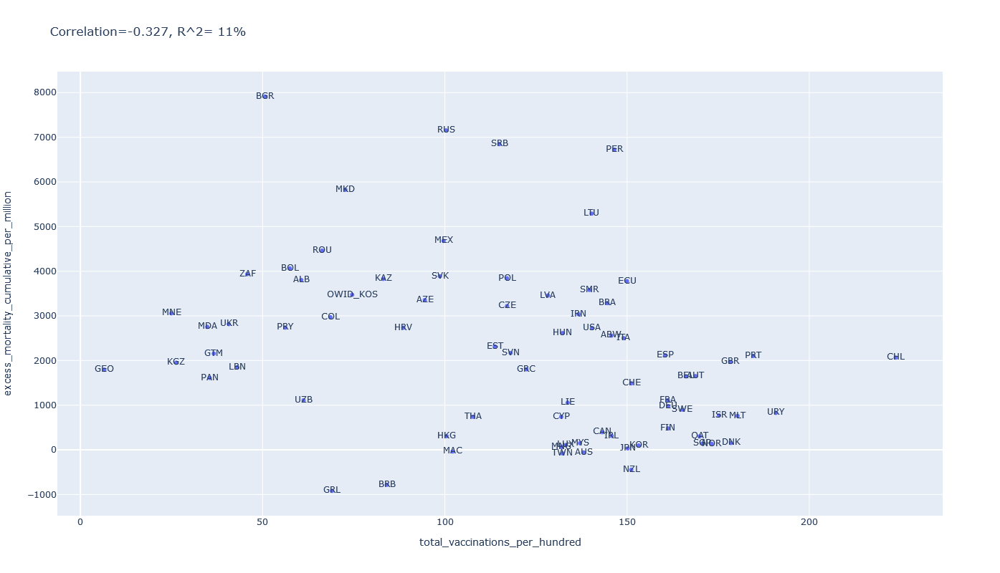

In [27]:
corr_val=df_max[['excess_mortality_cumulative_per_million','total_vaccinations_per_hundred']].corr().unstack().iloc[1]

reg = linear_model.LinearRegression()
model = reg.fit(df_max['total_vaccinations_per_hundred'].values.reshape(-1, 1), df_max['excess_mortality_cumulative_per_million'].values.reshape(-1, 1))
r2=reg.score(df_max['total_vaccinations_per_hundred'].values.reshape(-1, 1), df_max['excess_mortality_cumulative_per_million'].values.reshape(-1, 1))

fig = px.scatter(df_max,    
              x='total_vaccinations_per_hundred',
              y='excess_mortality_cumulative_per_million',
              text='iso_code',
              width=800,
              height=800,
              title="Correlation={: 1.3f}, R^2={: 1.0f}%".format(corr_val,r2*100),
             )
fig.show()

It is obvious from the chart that there is probably no linear relationship present for these two variables. The Coefficient of Determination (R^2) of 0.12 says that a linear model would explain 12% of the variance for a dependent variable.

 ## Bubble Chart 
 country size and max excess_mortality_cumulative_per_million and max total_vaccinations_per_hundred (max values per country).

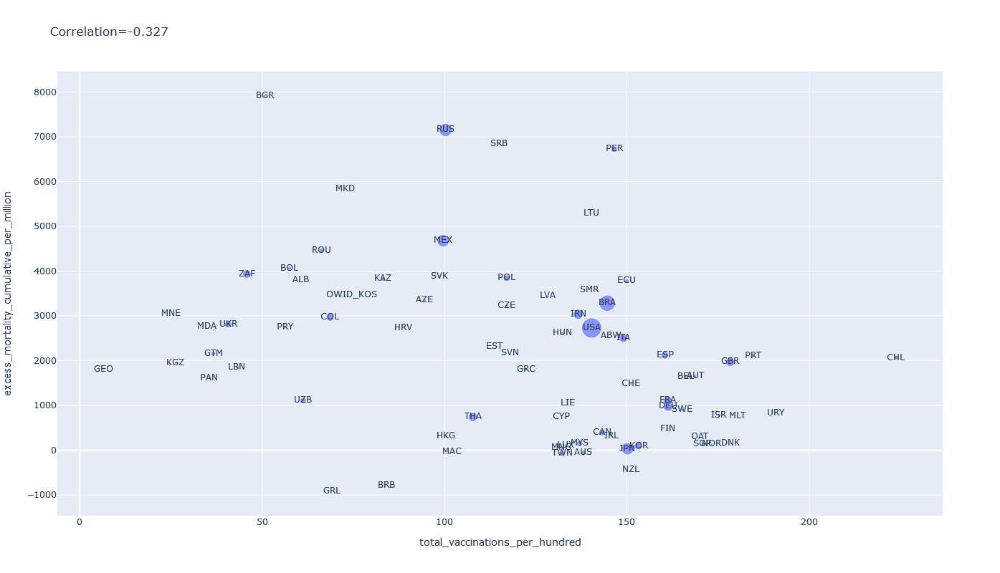

In [28]:
corr_val=df_max[['excess_mortality_cumulative_per_million','total_vaccinations_per_hundred']].corr().unstack().iloc[1]
fig = px.scatter(df_max,    
              x='total_vaccinations_per_hundred',
              y='excess_mortality_cumulative_per_million', 
              size='population',
              text='iso_code',
              width=800,
              height=800,
              title="Correlation={: 1.3f}".format(corr_val),
             )
fig.show()

We see two clusters split on roughly df_max['excess_mortality_cumulative_per_million'] = 27*df_max['total_vaccinations_per_hundred'] line so let's split our datset by this one and see what we get.

In [29]:
df_max['excess_vax_cluster']=np.where(df_max['excess_mortality_cumulative_per_million']/df_max['total_vaccinations_per_hundred']>25,1,0)
df_max['excess_vax_ratio']=df_max['excess_mortality_cumulative_per_million']/df_max['total_vaccinations_per_hundred']

## Bubble Chart per Cluster

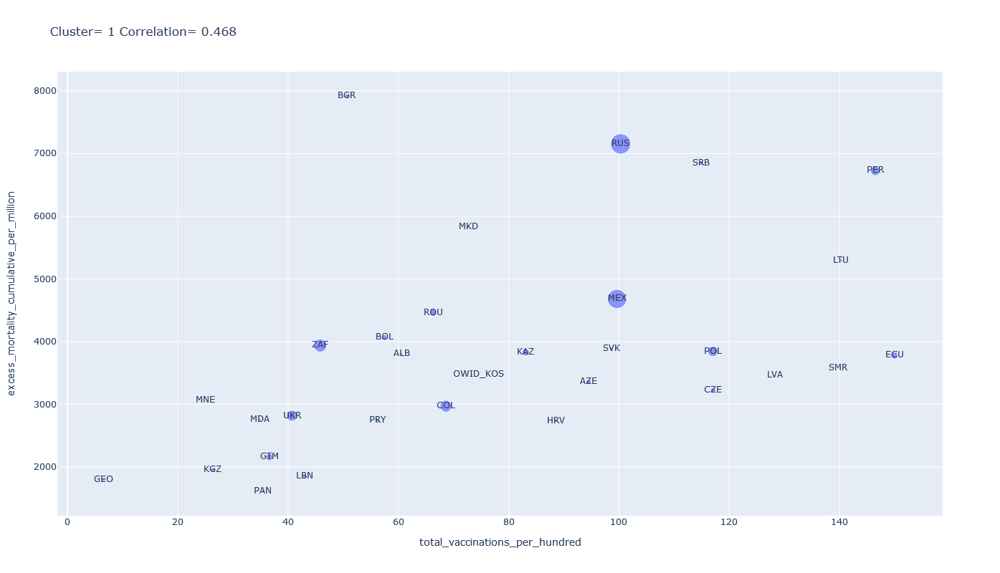

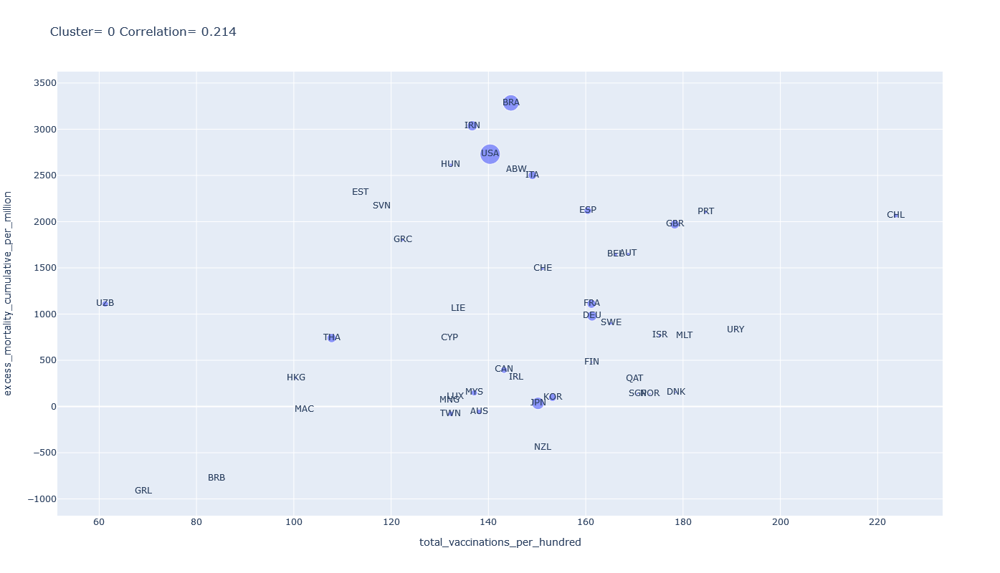

In [30]:
for cluster in [1,0]:
    corr_val=df_max.loc[df_max['excess_vax_cluster']==cluster,['excess_mortality_cumulative_per_million','total_vaccinations_per_hundred']].corr().unstack().iloc[1]
    fig = px.scatter(df_max.loc[df_max['excess_vax_cluster']==cluster],    
                  x='total_vaccinations_per_hundred',
                  y='excess_mortality_cumulative_per_million', 
                  size='population',
                  text='iso_code',
                  width=800,
                  height=800,
                  title="Cluster={: 1.0f} Correlation={: 1.3f}".format(cluster, corr_val),
                 )
    fig.show()

## Choropleth maps of 'excess_mortality_cumulative_per_million' and 'total_vaccinations_per_hundred' and clusters on their plain

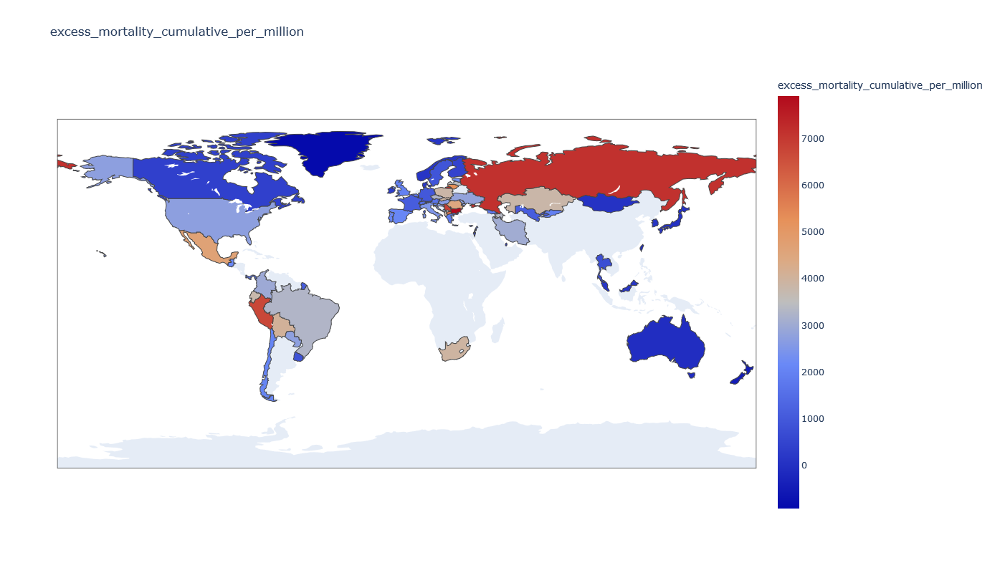

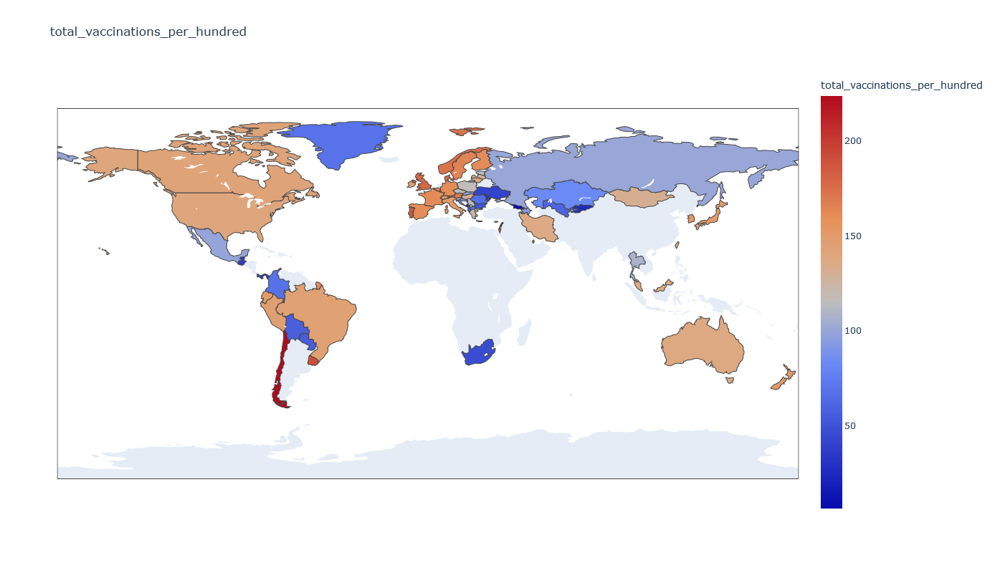

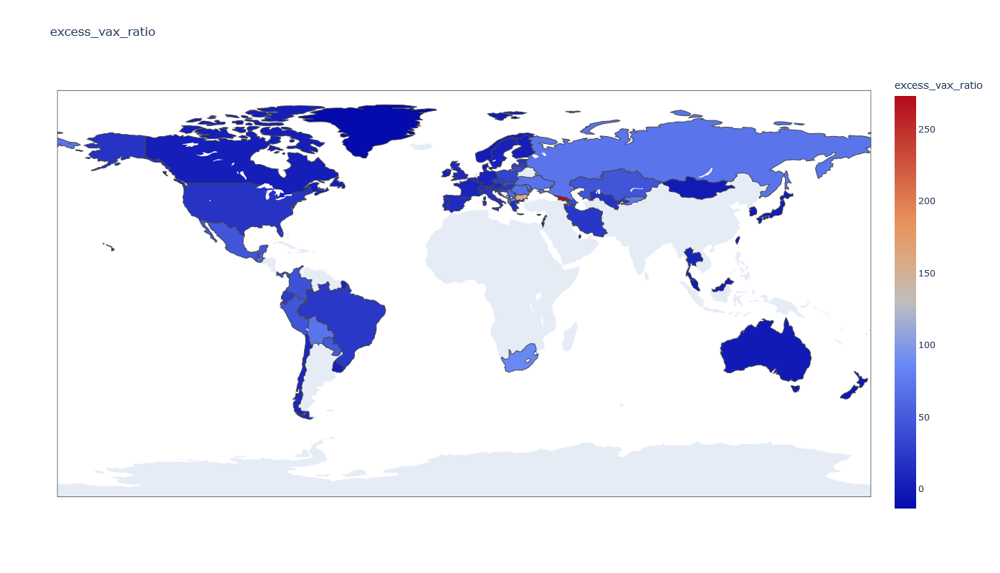

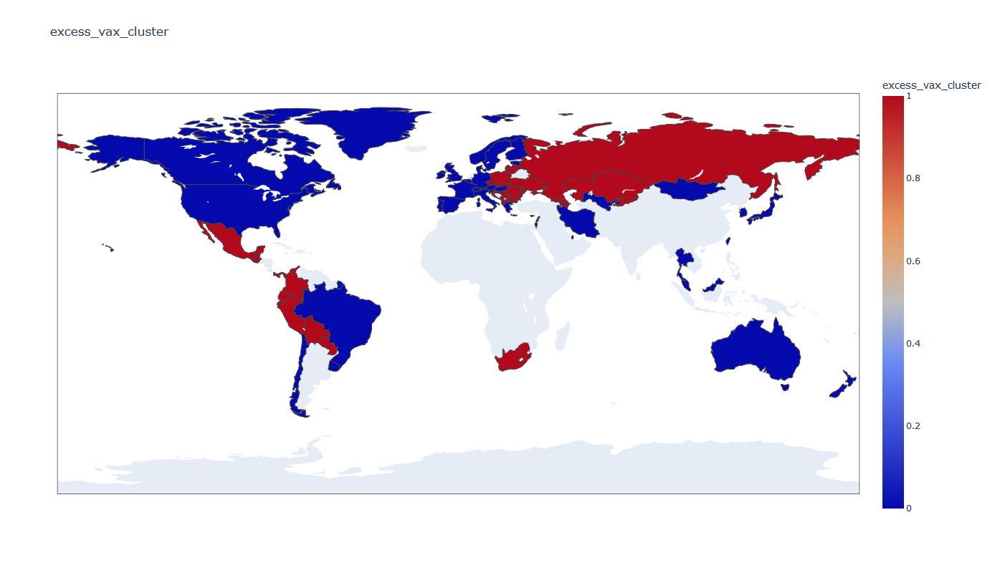

In [31]:
for metric in ['excess_mortality_cumulative_per_million','total_vaccinations_per_hundred','excess_vax_ratio','excess_vax_cluster',]:
    fig = go.Figure(data=go.Choropleth(
        locationmode = 'ISO-3',
        locations = df_max['iso_code'],
        z = df_max[metric],
        colorbar_title = metric,
        autocolorscale=False,
    ))
    fig.update_layout(
        width=1024,
        height=800,
        title_text=metric,
        geo=dict(
            showcoastlines=False,
        ),
        )
#    fig.show('png')
    fig.show()    

# Further exploration of linear model
Robust Linear Model to see where we get with life_expectancy and female_smokers as confounding variables

                               Robust linear Model Regression Results                              
Dep. Variable:     excess_mortality_cumulative_per_million   No. Observations:                   62
Model:                                                 RLM   Df Residuals:                       58
Method:                                               IRLS   Df Model:                            3
Norm:                                        TukeyBiweight                                         
Scale Est.:                                            mad                                         
Cov Type:                                               H1                                         
Date:                                     Thu, 13 Jan 2022                                         
Time:                                             04:34:49                                         
No. Iterations:                                         25                                         


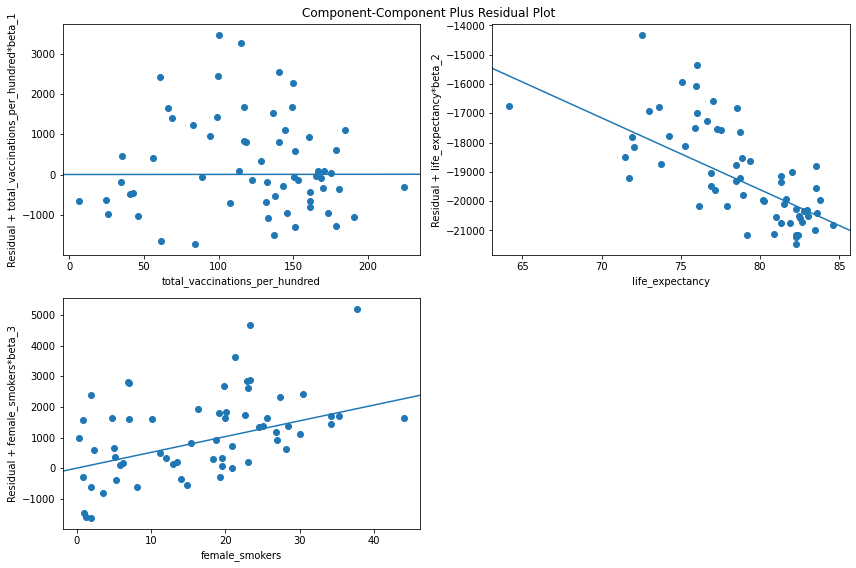

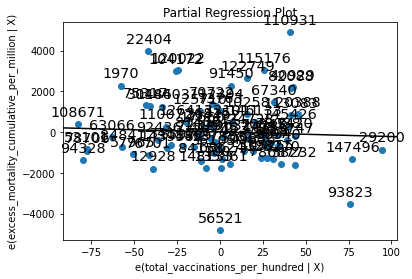

In [32]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.formula.api import rlm

#outliers=[110931,56521,93823,22404]
#print(df_max.loc[outliers,'location'])
# same outliers as above but now pinned by the country name as the index numbers change between dataset updates
subset = ~df_max.location.isin(['Peru','Greenland','Mongolia','Bulgaria'])

#model = ols('excess_mortality_cumulative_per_million ~ total_vaccinations_per_hundred+life_expectancy+female_smokers', data=df_max,subset=subset).fit()
model = rlm('excess_mortality_cumulative_per_million ~ total_vaccinations_per_hundred+life_expectancy+female_smokers', data=df_max,subset=subset,
           M=sm.robust.norms.TukeyBiweight(3),).fit(conv="weights")
print(model.summary())

fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_ccpr_grid(model, fig=fig)
fig = sm.graphics.plot_partregress(
    'excess_mortality_cumulative_per_million','total_vaccinations_per_hundred',['life_expectancy', 'female_smokers',] , data=df_max.fillna(df_max.mean()))
#fig = sm.graphics.plot_leverage_resid2(model)
#fig = sm.graphics.influence_plot(model, size=4)




## Just exploring. 
Let's see if we can get to a reasonable coefficient of determination using further variables from the dataset.

## Just mortality vs total vaccinations as the baseline

In [33]:
reg = linear_model.LinearRegression()
variables = ['total_vaccinations_per_hundred',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2={: 1.2f}%".format(100*r2))
print("Adjusted R^2={: 1.2f}%".format(100*r2a))


R^2= 10.69%
Adjusted R^2= 9.48%


## All population related variables AND total_vaccinations_per_hundred

In [34]:
reg = linear_model.LinearRegression()
variables = ['total_vaccinations_per_hundred',
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))

R^2 = 42.08%
Adjusted R^2 = 27.59%


In [35]:
import numpy as np
with np.printoptions(precision=2, suppress=True):
    print(dict(zip(variables,model.coef_)))

{'total_vaccinations_per_hundred': 5.083767272209008, 'population_density': -0.0778392836805674, 'median_age': 66.21120319565247, 'aged_65_older': 138.05043466450843, 'aged_70_older': -203.1149112840237, 'gdp_per_capita': -0.009104735427486582, 'extreme_poverty': 146.40792321476766, 'cardiovasc_death_rate': 3.0590834427152083, 'diabetes_prevalence': -25.497993320525833, 'female_smokers': 60.96517111099647, 'male_smokers': 0.3485827038170217, 'handwashing_facilities': 20.297289858368963, 'hospital_beds_per_thousand': -43.43451907592727, 'life_expectancy': -49.52266168102763, 'human_development_index': -10912.831993171496}


## All population related variables WITHOUT total_vaccinations_per_hundred

In [36]:
reg = linear_model.LinearRegression()
variables = [
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))

R^2 = 41.38%
Adjusted R^2 = 27.92%


## All population related variables AND total_vaccinations_per_hundred AND stringency_index

In [37]:
reg = linear_model.LinearRegression()
variables = ['total_vaccinations_per_hundred', 'stringency_index',
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))

R^2 = 42.09%
Adjusted R^2 = 26.39%


## All population related variables AND stringency_index

In [38]:
reg = linear_model.LinearRegression()
variables = ['stringency_index',
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))

R^2 = 41.38%
Adjusted R^2 = 26.73%


## All population related variables and interactions WITHOUT total_vaccinations_per_hundred

In [39]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2, interaction_only=True)
variables = [
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
Xp=poly.fit_transform(X)
reg = linear_model.LinearRegression()
model = reg.fit(Xp,y)
r2 = reg.score(Xp, y)
n = len(y)
k = Xp.shape[1]
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))
print('n data points =',n,', k terms = ',k)

R^2 = 100.00%
Adjusted R^2 = 100.00%
n data points = 76 , k terms =  106


## All population related variables and interactions AND total_vaccinations_per_hundred

In [40]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2, interaction_only=True)
variables = ['total_vaccinations_per_hundred',
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
Xp=poly.fit_transform(X)
reg = linear_model.LinearRegression()
model = reg.fit(Xp,y)
r2 = reg.score(Xp, y)
n = len(y)
k = Xp.shape[1]
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))
print('n data points =',n,', k terms = ',k)

R^2 = 100.00%
Adjusted R^2 = 100.00%
n data points = 76 , k terms =  121


We seem to overfit with the added interaction terms.

## Minimal population related variables and interactions that deliver high R^2

In [41]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2, interaction_only=True)
variables = ['aged_70_older', 'female_smokers', 'male_smokers', 
       'hospital_beds_per_thousand', 'diabetes_prevalence', 'life_expectancy', ]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
Xp=poly.fit_transform(X)
reg = linear_model.LinearRegression()
model = reg.fit(Xp,y)
r2 = reg.score(Xp, y)
n = len(y)
k = Xp.shape[1]
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))
print('n data points =',n,', k terms = ',k)

R^2 = 64.48%
Adjusted R^2 = 49.74%
n data points = 76 , k terms =  22


## Same population related variables WITHOUT total_vaccinations_per_hundred and WITHOUT interaction

In [42]:
reg = linear_model.LinearRegression()
variables = ['aged_70_older', 'female_smokers', 'male_smokers', 
       'hospital_beds_per_thousand', 'diabetes_prevalence', 'life_expectancy',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))
print('n data points =',n,', k terms = ',k)

R^2 = 32.98%
Adjusted R^2 = 27.15%
n data points = 76 , k terms =  6


## mortality vs total vaccinations and policy

In [43]:
reg = linear_model.LinearRegression()
variables = ['total_vaccinations_per_hundred','stringency_index']
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))

R^2 = 11.55%
Adjusted R^2 = 9.13%


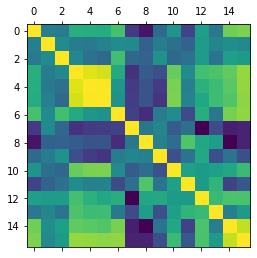

,total_vaccinations_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
total_vaccinations_per_hundred,1.00,0.04,0.01,0.37,0.37,0.36,0.51,-0.40,-0.59,-0.10,0.19,-0.35,0.26,-0.01,0.64,0.66
stringency_index,0.04,1.00,0.13,0.02,0.01,0.05,0.12,0.11,-0.16,0.03,-0.06,-0.16,0.25,0.08,0.14,0.11
population_density,0.01,0.13,1.00,0.10,-0.06,-0.11,0.49,-0.13,-0.15,0.17,-0.12,-0.05,0.24,-0.05,0.27,0.23
median_age,0.37,0.02,0.10,1.00,0.92,0.89,0.35,-0.44,-0.19,-0.27,0.61,0.13,0.50,0.53,0.59,0.73
aged_65_older,0.37,0.01,-0.06,0.92,1.00,0.99,0.20,-0.39,-0.26,-0.39,0.66,0.05,0.40,0.47,0.57,0.73
aged_70_older,0.36,0.05,-0.11,0.89,0.99,1.00,0.18,-0.38,-0.25,-0.43,0.66,0.07,0.32,0.47,0.54,0.71
gdp_per_capita,0.51,0.12,0.49,0.35,0.20,0.18,1.00,-0.35,-0.47,0.02,0.13,-0.30,0.37,-0.01,0.66,0.72
extreme_poverty,-0.40,0.11,-0.13,-0.44,-0.39,-0.38,-0.35,1.00,-0.03,0.08,-0.19,-0.06,-0.69,-0.30,-0.55,-0.53
cardiovasc_death_rate,-0.59,-0.16,-0.15,-0.19,-0.26,-0.25,-0.47,-0.03,1.00,0.05,-0.08,0.54,0.32,0.26,-0.69,-0.52
diabetes_prevalence,-0.10,0.03,0.17,-0.27,-0.39,-0.43,0.02,0.08,0.05,1.00,-0.27,-0.04,0.33,-0.28,-0.05,-0.27


In [44]:
variables = ['total_vaccinations_per_hundred', 'stringency_index',
       'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index',]
correlation_matrix=df_max[variables].corr()
import matplotlib.pyplot as plt
plt.matshow(correlation_matrix)
plt.show()
correlation_matrix
correlation_matrix.style.background_gradient(cmap='viridis', axis=None).set_precision(2)

## Less correlated variables AND total_vaccinations_per_hundred AND stringency_index

In [45]:
reg = linear_model.LinearRegression()
variables=['total_vaccinations_per_hundred', 'stringency_index',
       'population_density', 
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))
print(dict(zip(variables,model.coef_)))


R^2 = 40.24%
Adjusted R^2 = 28.86%
{'total_vaccinations_per_hundred': 4.422907654860368, 'stringency_index': -3.4320979458821395, 'population_density': -0.08535097096294185, 'aged_70_older': 66.18408755783501, 'extreme_poverty': 170.601786018347, 'cardiovasc_death_rate': 3.683350923721191, 'diabetes_prevalence': -15.319334619705824, 'female_smokers': 63.82661949317468, 'male_smokers': 1.0772169904725784, 'handwashing_facilities': 26.29239530642896, 'hospital_beds_per_thousand': -9.766899435577583, 'human_development_index': -12625.104035738423}


## Selected variables AND total_vaccinations_per_hundred AND stringency_index
We remove variables 'population_density', 'male_smokers' that show low influence on the dependent variable. It insignificantly reduces the R^2 from 40% to 39%. 

In [46]:
reg = linear_model.LinearRegression()
variables=['total_vaccinations_per_hundred', 'stringency_index',
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))
print(dict(zip(variables,model.coef_)))

R^2 = 39.05%
Adjusted R^2 = 29.68%
{'total_vaccinations_per_hundred': 5.099139094122482, 'stringency_index': -5.083078507068622, 'aged_70_older': 91.69642829760247, 'extreme_poverty': 169.0367445927171, 'cardiovasc_death_rate': 3.7265806058797115, 'diabetes_prevalence': -18.51082677601664, 'female_smokers': 63.02018949992404, 'handwashing_facilities': 26.881572232319776, 'hospital_beds_per_thousand': -16.510550856995618, 'human_development_index': -14102.536471252959}


### Adding interactions between variables 

In [47]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2, interaction_only=True)
variables=['total_vaccinations_per_hundred', 'stringency_index',
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
Xp=poly.fit_transform(X)
reg = linear_model.LinearRegression()
model = reg.fit(Xp,y)
r2 = reg.score(Xp, y)
n = len(y)
k = Xp.shape[1]
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))

R^2 = 85.71%
Adjusted R^2 = 43.59%


### And removing 'stringency_index'

In [48]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2, interaction_only=True)
variables=['total_vaccinations_per_hundred', 
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
Xp=poly.fit_transform(X)
reg = linear_model.LinearRegression()
model = reg.fit(Xp,y)
r2 = reg.score(Xp, y)
n = len(y)
k = Xp.shape[1]
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))

R^2 = 18.81%
Adjusted R^2 =-109.97%


### Or removing 'total_vaccinations_per_hundred'

In [49]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2, interaction_only=True)
variables=['stringency_index', 
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
Xp=poly.fit_transform(X)
reg = linear_model.LinearRegression()
model = reg.fit(Xp,y)
r2 = reg.score(Xp, y)
n = len(y)
k = Xp.shape[1]
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))

R^2 = 15.13%
Adjusted R^2 =-119.48%


## Selected variables WITHOUT total_vaccinations_per_hundred WITHOUT stringency_index

In [50]:
reg = linear_model.LinearRegression()
variables=[
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]
X = df_max[variables].fillna(df.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))
print(dict(zip(variables,model.coef_)))

R^2 = 38.10%
Adjusted R^2 = 30.71%
{'aged_70_older': 95.20402584608809, 'extreme_poverty': 118.07227949766458, 'cardiovasc_death_rate': 3.0077220766504373, 'diabetes_prevalence': -14.742099146165446, 'female_smokers': 61.17805551071007, 'handwashing_facilities': 20.006601602990546, 'hospital_beds_per_thousand': -20.226826978930557, 'human_development_index': -13090.23191318833}


### Adding interactions between variables 

In [51]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2, interaction_only=True)
variables=[
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
Xp=poly.fit_transform(X)
reg = linear_model.LinearRegression()
model = reg.fit(Xp,y)
r2 = reg.score(Xp, y)
n = len(y)
k = Xp.shape[1]
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))

R^2 = 5.16%
Adjusted R^2 =-87.19%


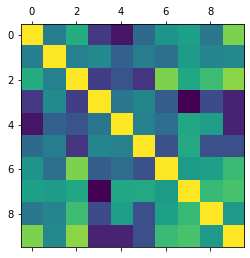

,total_vaccinations_per_hundred,stringency_index,aged_70_older,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,handwashing_facilities,hospital_beds_per_thousand,human_development_index
total_vaccinations_per_hundred,1.00,0.04,0.36,-0.40,-0.59,-0.10,0.19,0.26,-0.01,0.66
stringency_index,0.04,1.00,0.05,0.11,-0.16,0.03,-0.06,0.25,0.08,0.11
aged_70_older,0.36,0.05,1.00,-0.38,-0.25,-0.43,0.66,0.32,0.47,0.71
extreme_poverty,-0.40,0.11,-0.38,1.00,-0.03,0.08,-0.19,-0.69,-0.30,-0.53
cardiovasc_death_rate,-0.59,-0.16,-0.25,-0.03,1.00,0.05,-0.08,0.32,0.26,-0.52
diabetes_prevalence,-0.10,0.03,-0.43,0.08,0.05,1.00,-0.27,0.33,-0.28,-0.27
female_smokers,0.19,-0.06,0.66,-0.19,-0.08,-0.27,1.00,0.23,0.27,0.46
handwashing_facilities,0.26,0.25,0.32,-0.69,0.32,0.33,0.23,1.00,0.46,0.51
hospital_beds_per_thousand,-0.01,0.08,0.47,-0.30,0.26,-0.28,0.27,0.46,1.00,0.22
human_development_index,0.66,0.11,0.71,-0.53,-0.52,-0.27,0.46,0.51,0.22,1.00


In [52]:
variables=['total_vaccinations_per_hundred', 'stringency_index',
       'aged_70_older', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'human_development_index',]
correlation_matrix=df_max[variables].corr()
import matplotlib.pyplot as plt
plt.matshow(correlation_matrix)
plt.show()
correlation_matrix
correlation_matrix.style.background_gradient(cmap='viridis').set_precision(2)


In [53]:
reg = linear_model.LinearRegression()
variables=['total_vaccinations_per_hundred',         
       'life_expectancy', 'median_age', 'diabetes_prevalence', 'male_smokers', 'extreme_poverty', 'gdp_per_capita',  'aged_65_older', 'stringency_index', 'cardiovasc_death_rate', ]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))
print(dict(zip(variables,model.coef_)))

R^2 = 32.99%
Adjusted R^2 = 22.69%
{'total_vaccinations_per_hundred': 3.8422203230574135, 'life_expectancy': -86.0833294115159, 'median_age': 19.73774875944812, 'diabetes_prevalence': 30.667395874275808, 'male_smokers': 14.59878502834276, 'extreme_poverty': 154.88586117470615, 'gdp_per_capita': -0.022940941626660494, 'aged_65_older': 47.19648565631097, 'stringency_index': -3.5742452453915723, 'cardiovasc_death_rate': 3.22479011662288}


In [54]:
reg = linear_model.LinearRegression()
variables=['total_vaccinations_per_hundred',    
       'life_expectancy', 'female_smokers',   
          ]
X = df_max[variables].fillna(df_max.mean()).values
y = df_max['excess_mortality_cumulative_per_million'].values
model = reg.fit(X,y)
r2 = reg.score(X, y)
n = len(y)
k = len(variables)
r2a = 1-( (1-r2)*(n-1)/(n-k-1) )
print("R^2 ={: 1.2f}%".format(100*r2))
print("Adjusted R^2 ={: 1.2f}%".format(100*r2a))
print(dict(zip(variables,model.coef_)))

R^2 = 32.60%
Adjusted R^2 = 29.79%
{'total_vaccinations_per_hundred': -2.2151501801618236, 'life_expectancy': -236.75693184042606, 'female_smokers': 66.79331079565407}


Copyright 2021 Abbrivia GmbH https://www.abbrivia.com CC-BY (By Attribution) 4.0 https://creativecommons.org/licenses/by/4.0/legalcode
Reuse our work freely

All visualizations, and code produced in this notebook are completely open access under the Creative Commons BY license. You have the permission to use, distribute, and reproduce these in any medium, provided the source and authors are credited.

The data produced by third parties and made available by "Our World in Data" is subject to the license terms from the original third-party authors. Check the license of any third-party data before use and redistribution on 'https://ourworldindata.org/coronavirus' site (see below).

# Getting the Data

See the defintions and further discussion on the used dataset at the "Our World in Data" site  https://ourworldindata.org/covid-vaccinations

The data is taken specifically from https://covid.ourworldindata.org/data/owid-covid-data.xlsx file

Hannah Ritchie, Edouard Mathieu, Lucas Rodés-Guirao, Cameron Appel, Charlie Giattino, Esteban Ortiz-Ospina, Joe Hasell, Bobbie Macdonald, Diana Beltekian and Max Roser (2020) - "Coronavirus Pandemic (COVID-19)". Published online at OurWorldInData.org. Retrieved from: 'https://ourworldindata.org/coronavirus' [Online Resource]

We use Excel file because it contains the data format information in itself. If you want to run this more often consider manually downloading the data and sourcing it locally as shown in the next line (commented out).

In [55]:
del d